Lake Erie ERA5 Data model point viewer
=======================================

In [1]:
import holoviews as hv
import hvplot.pandas
from pathlib import Path
import dask.dataframe as dd
import pandas as pd
import geopandas as gpd

C:\Users\xrnogueira\AppData\Local\Temp\ipykernel_3332\4056524812.py:6: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


In [2]:
ELEMENTS_DIR = Path(Path.cwd() / 'elements_data')
#pd.options.plotting.backend = 'matplotlib'

In [3]:
df_u = pd.read_parquet(ELEMENTS_DIR / 'apr_2011_10m_u_component_of_wind.parquet')
df_v= pd.read_parquet(ELEMENTS_DIR / 'apr_2011_10m_v_component_of_wind.parquet')
df_u.index = df_u.index.astype(str)
df_v.index = df_v.index.astype(str)

In [4]:
df_u = df_u.T
df_v = df_v.T

In [5]:
elements_df = pd.read_csv(
    Path.cwd() / 'element_latlongs.csv',
    usecols=['NELE', 'lon', 'lat'],
)

In [6]:
# convert index to string
elements_df.NELE = elements_df.NELE.astype(str)
elements_df.set_index('NELE', inplace=True)
elements_df_u = elements_df.join(df_u)
elements_df_v = elements_df.join(df_v)

In [7]:
dates = elements_df_u.columns[2:]
dates

Index(['2011-04-01 00:00:00', '2011-04-01 01:00:00', '2011-04-01 02:00:00',
       '2011-04-01 03:00:00', '2011-04-01 04:00:00', '2011-04-01 05:00:00',
       '2011-04-01 06:00:00', '2011-04-01 07:00:00', '2011-04-01 08:00:00',
       '2011-04-01 09:00:00',
       ...
       '2011-04-30 14:00:00', '2011-04-30 15:00:00', '2011-04-30 16:00:00',
       '2011-04-30 17:00:00', '2011-04-30 18:00:00', '2011-04-30 19:00:00',
       '2011-04-30 20:00:00', '2011-04-30 21:00:00', '2011-04-30 22:00:00',
       '2011-04-30 23:00:00'],
      dtype='object', length=648)

In [8]:
lon_lat_cols = ['lon', 'lat']

In [9]:
u_data = elements_df_u[dates].to_numpy()
v_data = elements_df_v[dates].to_numpy()

In [10]:
import numpy as np

In [11]:
angles = np.arctan2(u_data, v_data)
angles_deg = np.degrees(angles) + 180
angles_deg

array([[165.87637 , 172.82587 , 178.22403 , ..., 104.46745 ,  96.92997 ,
         96.49226 ],
       [166.73322 , 173.80226 , 179.7458  , ..., 104.596725,  97.03769 ,
         96.604324],
       [167.67531 , 174.7133  , 181.15263 , ..., 104.24027 ,  96.70013 ,
         96.42526 ],
       ...,
       [107.632355, 127.02727 , 130.47441 , ..., 102.97213 , 106.821556,
        104.85024 ],
       [105.11494 , 125.85391 , 129.69241 , ..., 103.499344, 107.53298 ,
        105.341   ],
       [105.11494 , 125.85391 , 129.69241 , ..., 103.499344, 107.53298 ,
        105.341   ]], dtype=float32)

In [12]:
elements_df[dates] = angles_deg.copy()
elements_df

C:\Users\xrnogueira\AppData\Local\Temp\ipykernel_3332\4116989325.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  elements_df[dates] = angles_deg.copy()
C:\Users\xrnogueira\AppData\Local\Temp\ipykernel_3332\4116989325.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  elements_df[dates] = angles_deg.copy()
C:\Users\xrnogueira\AppData\Local\Temp\ipykernel_3332\4116989325.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Cons

,lon,lat,2011-04-01 00:00:00,2011-04-01 01:00:00,2011-04-01 02:00:00,2011-04-01 03:00:00,2011-04-01 04:00:00,2011-04-01 05:00:00,2011-04-01 06:00:00,2011-04-01 07:00:00,...,2011-04-30 14:00:00,2011-04-30 15:00:00,2011-04-30 16:00:00,2011-04-30 17:00:00,2011-04-30 18:00:00,2011-04-30 19:00:00,2011-04-30 20:00:00,2011-04-30 21:00:00,2011-04-30 22:00:00,2011-04-30 23:00:00
NELE,,,,,,,,,,,,,,,,,,,,,
1,-83.180764,42.082018,165.876373,172.825867,178.224030,237.188019,286.599884,302.517395,309.684570,318.725769,...,125.581268,125.936966,126.120247,120.519608,113.690262,113.744492,110.765663,104.467453,96.929970,96.492264
2,-83.175650,42.086544,166.733215,173.802261,179.745804,241.626190,290.554382,304.578369,311.172180,319.745880,...,125.738190,126.029785,126.226486,120.650269,113.825500,113.882217,110.937958,104.596725,97.037689,96.604324
3,-83.164733,42.081867,167.675308,174.713303,181.152634,243.430450,290.737976,304.392334,311.026001,319.554932,...,125.737854,125.939423,126.100227,120.448753,113.512390,113.458641,110.563286,104.240273,96.700127,96.425262
4,-83.158800,42.086300,168.543762,175.709732,182.759109,247.875214,294.519165,306.410583,312.487396,320.556030,...,125.893875,126.032143,126.206558,120.580589,113.649376,113.598083,110.737213,104.370346,96.807220,96.536522
5,-83.146400,42.086167,169.745178,176.982452,184.806534,251.879456,297.010895,307.604431,313.346497,321.081421,...,125.996796,126.033707,126.193329,120.534317,113.532585,113.410133,110.604362,104.220718,96.654922,96.491768
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11827,-82.680767,41.464611,110.203049,128.208099,131.268005,155.888962,222.953033,238.302704,245.798782,256.783600,...,126.519577,128.061127,131.668610,125.022644,113.851334,111.929298,108.709595,102.452423,106.120026,104.367096
11828,-82.685935,41.456920,105.787491,125.977287,129.962204,154.210480,219.946259,236.518204,244.131927,254.944031,...,126.460869,128.443756,132.408890,126.184937,115.127655,113.357468,110.238838,103.881462,107.674164,105.383232
11829,-82.677034,41.460443,107.632355,127.027267,130.474411,154.878220,221.934128,237.716217,245.206879,256.084808,...,126.566925,128.243988,132.000778,125.527145,114.382263,112.498825,109.295296,102.972130,106.821556,104.850243


In [13]:
# get range for plotting colors
max_val = elements_df[elements_df.columns[2:]].max().max()
min_val = elements_df[elements_df.columns[2:]].min().min()
print(f'Max/min = {max_val}/{min_val}')

Max/min = 360.0/4.57763671875e-05


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
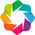

In [14]:
from shapely import geometry, Point
import cartopy.crs as ccrs
import geoviews as gv
hv.extension('bokeh')
gv.extension('bokeh', 'matplotlib')

In [15]:
elements_df.rename(columns={'lon':'Longitude', 'lat':'Latitude',}, inplace=True)
geometry = [Point(xy) for xy in zip(elements_df['Longitude'], elements_df['Latitude'])]
elements_df['geometry'] = geometry

In [16]:
%%time
pngs = []
for i, date in enumerate(dates):
    elements_df[date] = elements_df[date].apply(abs)
    sub_df = gpd.GeoDataFrame(
        data=elements_df[[date] + ['Longitude', 'Latitude']],
        geometry=elements_df['geometry'],
        crs='4326',
    )
    p = sub_df.hvplot.points(
        x='Longitude',
        y='Latitude',
        width=1000,
        height=500,
        c=date,
        title=date + 'Wind Direction (degrees)',
        clim=(0, 360),
        colorbar=True,
        size=6,
        crs='4326',
        cmap='hsv',
        tiles='StamenTerrainRetina',
        xlim=(sub_df.Longitude.min(), sub_df.Longitude.max()),
        ylim=(sub_df.Latitude.min(), sub_df.Latitude.max()),
    )#.opts(backend='matplotlib')
    pngs.append(p)

CPU times: total: 38.7 s
Wall time: 39 s


In [17]:
import concurrent.futures
#from concurrent.futures import ThreadPoolExecuter

In [22]:
def save_plot(input_tuple):
    hv.save(input_tuple[0], filename=input_tuple[1])
    return True

In [23]:
dates_list = list(dates)
result = map(save_plot, list(zip(pngs, [f'wind_dir_image{dates_list.index(date)}.png' for date in dates])))

In [25]:
for i in  list(zip(pngs, [f'wind_dir_image{dates_list.index(date)}.png' for date in dates])):
    save_plot(i)
    print(i)

(:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (2011-04-01 00:00:00), 'wind_dir_image0.png')
(:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (2011-04-01 01:00:00), 'wind_dir_image1.png')
(:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (2011-04-01 02:00:00), 'wind_dir_image2.png')
(:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (2011-04-01 03:00:00), 'wind_dir_image3.png')
(:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (2011-04-01 04:00:00), 'wind_dir_image4.png')
(:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (2011-04-01 05:00:00), 'wind_dir_image5.png')
(:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (2011-04-01 06:00:00), 'wind_dir_image6.png')
(:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (2011-

In [24]:
%%time
result

CPU times: total: 0 ns
Wall time: 0 ns


In [ ]:
save = False

if save:
    with concurrent.futures.ThreadPoolExecutor(max_workers=8) as executer:
        print('milti')
        futures = [executer.map(
            save_plot, list(zip(pngs, [f'wind_dir_image{dates_list.index(date)}.png' for date in dates]))
        )]
        print(futures)
        for i, future in enumerate(concurrent.futures.as_completed(futures)):
            print(i)
        
            

In [30]:
import imageio

In [27]:
all_pngs = [f'wind_dir_image{dates_list.index(date)}.png' for date in dates]

In [80]:
%%time
# read in the images
images = [imageio.imread(filename) for filename in all_pngs]

# save the images as a GIF
out_filename = "Lake_Erie_wind_direction.gif"
imageio.mimsave(out_filename, images, fps=20)


<timed exec>:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.


CPU times: total: 1min 17s
Wall time: 1min 18s


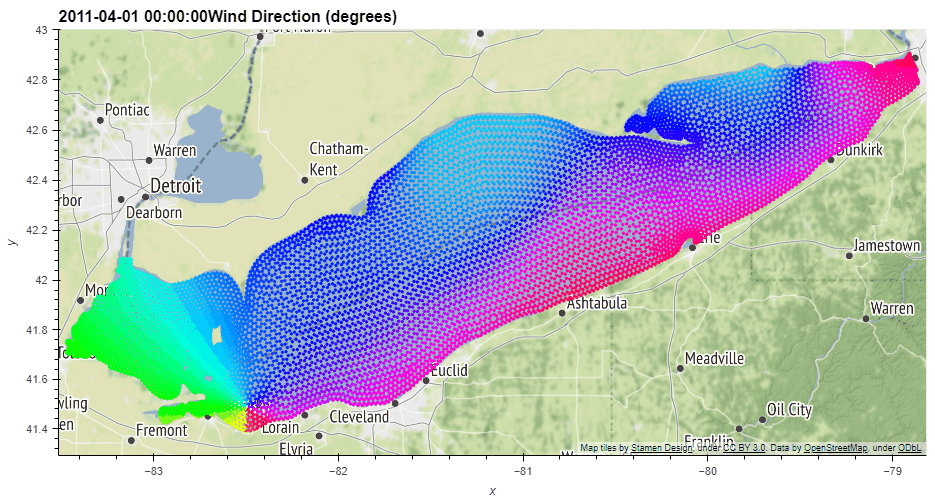

In [50]:
from PIL import Image
# Open the gif file
gif = Image.open("Lake_Erie_wind_direction.gif")
cropped_gif = gif.crop((0, 0, 935, 500))
cropped_gif

In [59]:
colorbar.height

500

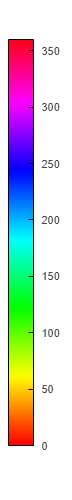

In [63]:
# Open the colorbar image
colorbar = Image.open('colorbar.png').crop((5, 0, 77, 500))
colorbar

1000


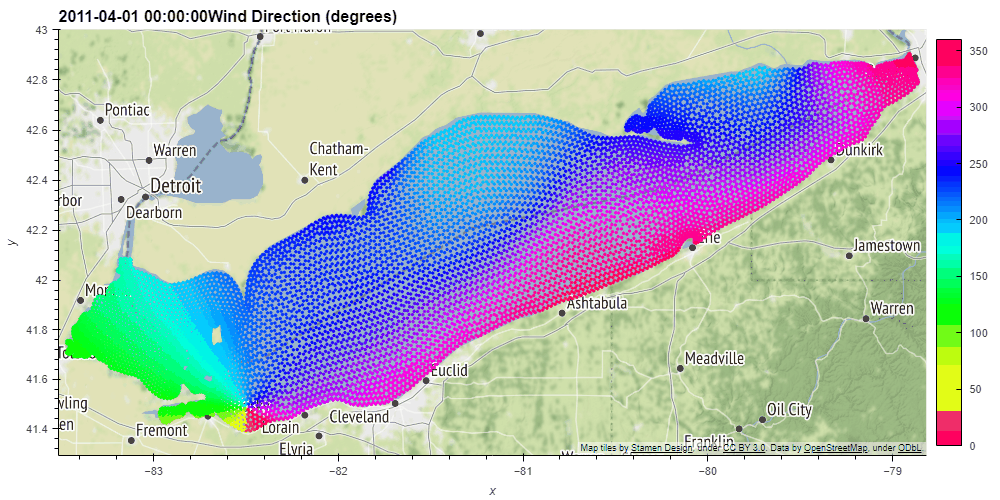

In [76]:
# Create a new image with the same size as the original gif and a transparent background
new_image = Image.new('RGBA', gif.size, (0, 0, 0, 0))

# Paste the cropped gif into the new image
new_image.paste(gif, (0, 0))
print(new_image.width)
new_image

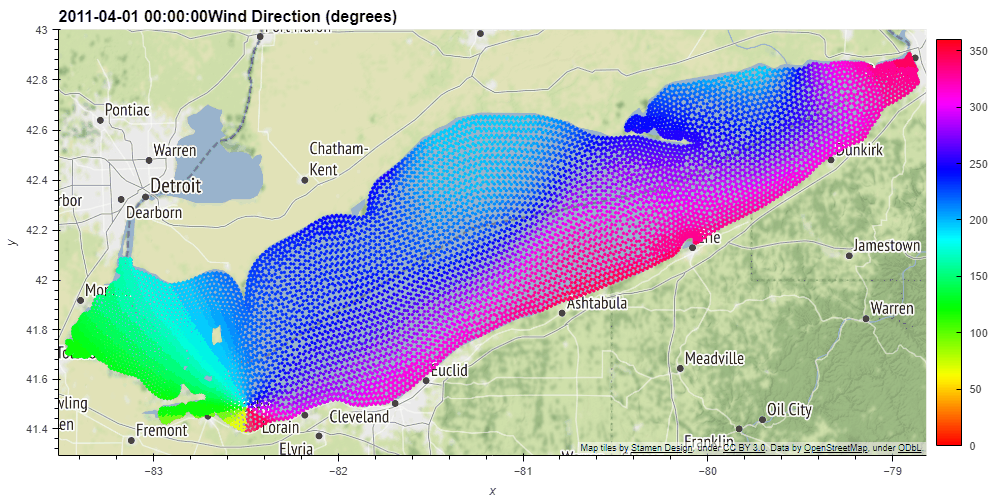

In [77]:
# Paste the colorbar image into the new image at the desired position
new_image.paste(colorbar, (928, 0)) # Replace (500, 0) with the coordinates of the position you want to place the colorbar
new_image

In [78]:
new_image.height

500

In [79]:
new_image.save("Lake_Erie_wind_direction_cbar_fixed.gif")

In [ ]:
hvplot.help('line')